# Резултати от тренирането

In [1]:
from IPython.core.display import HTML

def show_losses():
    return HTML(' \
        <style> \
          .loss_container { display: flex} \
          .title { font-wieght: bold; font-size: 20px; text-align: center}\
        </style> \
        <div class="loss_container"> \
          <div class="graph"> \
           <div class="title">Focal Loss:</div> \
           <img src="./images/loss.svg" style="width: 700px; height:300px" /> \
          </div> \
          <div class="graph"> \
           <div class="title">Regression Loss:</div> \
           <img src="./images/regression_loss.svg" style="width: 700px; height:300px" /> \
          </div> \
        </div> \
        <div class="loss_container"> \
          <div class="graph"> \
           <div class="title">Classification Loss:</div> \
           <img src="./images/classification_loss.svg" style="width: 700px; height:300px" /> \
          </div> \
          <div class="graph"> \
           <div class="title">mAP:</div> \
           <img src="./images/mAP.svg" style="width: 700px; height:300px" /> \
          </div> \
        </div> \
    ')

Това са резултати от тренирането след 15 епохи. Учудващо е, че mAP е над 70%, тъй като както видяхме по-рано - 1/3 от примерите (най-малките кораби) не се взимат предвид при тренирането

In [2]:
show_losses()

Краен резултат - mAP 0.73 върху тестовото множество.

# Разпознаване на кораби от тренировъчните данни

## Конвертиране на модела от тренировъчен към предсказващ

In [3]:
!retinanet-convert-model --backbone 'resnet50' --config ./anchor_parameters.ini \
                         ./snapshots/resnet50_csv_15.h5 ./snapshots/inference15.h5

Using TensorFlow backend.
2019-02-13 23:16:30.151722: I tensorflow/core/platform/profile_utils/cpu_utils.cc:94] CPU Frequency: 2808000000 Hz
2019-02-13 23:16:30.152295: I tensorflow/compiler/xla/service/service.cc:162] XLA service 0x5635b0934b80 executing computations on platform Host. Devices:
2019-02-13 23:16:30.152330: I tensorflow/compiler/xla/service/service.cc:169]   StreamExecutor device (0): <undefined>, <undefined>
2019-02-13 23:16:30.154739: I tensorflow/stream_executor/platform/default/dso_loader.cc:154] successfully opened CUDA library libcuda.so.1 locally
2019-02-13 23:16:30.159453: E tensorflow/stream_executor/cuda/cuda_driver.cc:303] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2019-02-13 23:16:30.159493: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:161] retrieving CUDA diagnostic information for host: tisho-ThinkPad-T470p
2019-02-13 23:16:30.159502: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:168] hostname: tisho-Thi

## Зареждаме необходимите модули

In [4]:
import warnings
warnings.simplefilter("ignore", UserWarning)

# disable gpu
import os
os.environ["CUDA_VISIBLE_DEVICES"]="-1"    

# show images inline
%matplotlib inline

# automatically reload modules when they have changed
%load_ext autoreload
%autoreload 2

# import keras
import keras

# import keras_retinanet
from keras_retinanet import models
from keras_retinanet.utils.image import read_image_bgr, preprocess_image, resize_image
from keras_retinanet.utils.visualization import draw_box, draw_caption
from keras_retinanet.utils.colors import label_color

# import miscellaneous modules
import matplotlib.pyplot as plt
import cv2
import os
import numpy as np
import time
import random
import pandas as pd

train_dir = '../data/train_v2'
labels_to_names = {0: 'ship'}

def find_ships(file_names):
    for file in file_names:
        print(file)
        image = read_image_bgr(train_dir + '/' + file)

        # copy to draw on
        draw = image.copy()
        draw = cv2.cvtColor(draw, cv2.COLOR_BGR2RGB)

        # preprocess image for network
        image = preprocess_image(image)
        image, scale = resize_image(image)

        # process image
        start = time.time()
        labels = ['ships']
        boxes, scores, labels = model.predict_on_batch(np.expand_dims(image, axis=0))
        print("processing time: ", time.time() - start)

        # correct for image scale
        boxes /= scale

        # visualize detections
        for box, score, label in zip(boxes[0], scores[0], labels[0]):
            # scores are sorted so we can break
            if score < 0.5:
                break

            color = label_color(label)

            b = box.astype(int)
            draw_box(draw, b, color=color)

            caption = "{} {:.3f}".format(labels_to_names[label], score)
            draw_caption(draw, b, caption)

        plt.figure(figsize=(15, 15))
        plt.axis('off')
        plt.imshow(draw)
        plt.show()

Using TensorFlow backend.


## Зареждаме RetinaNet модела

In [5]:
model_path = os.path.join('snapshots', 'inference15.h5')
model = models.load_model(model_path, backbone_name='resnet50')

## Разпознаване върху тестовите данни

Понякога получаваме по повече от един bounding box за един и същи кораб

7038dc0da.jpg
processing time:  1.5589232444763184


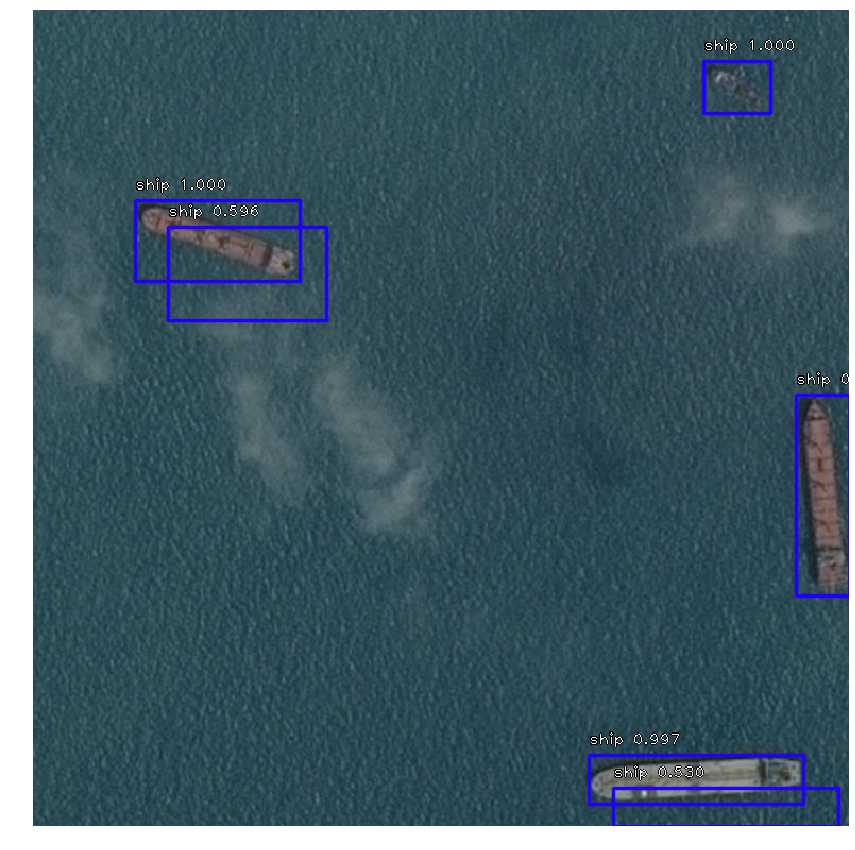

5c7138820.jpg
processing time:  1.036421775817871


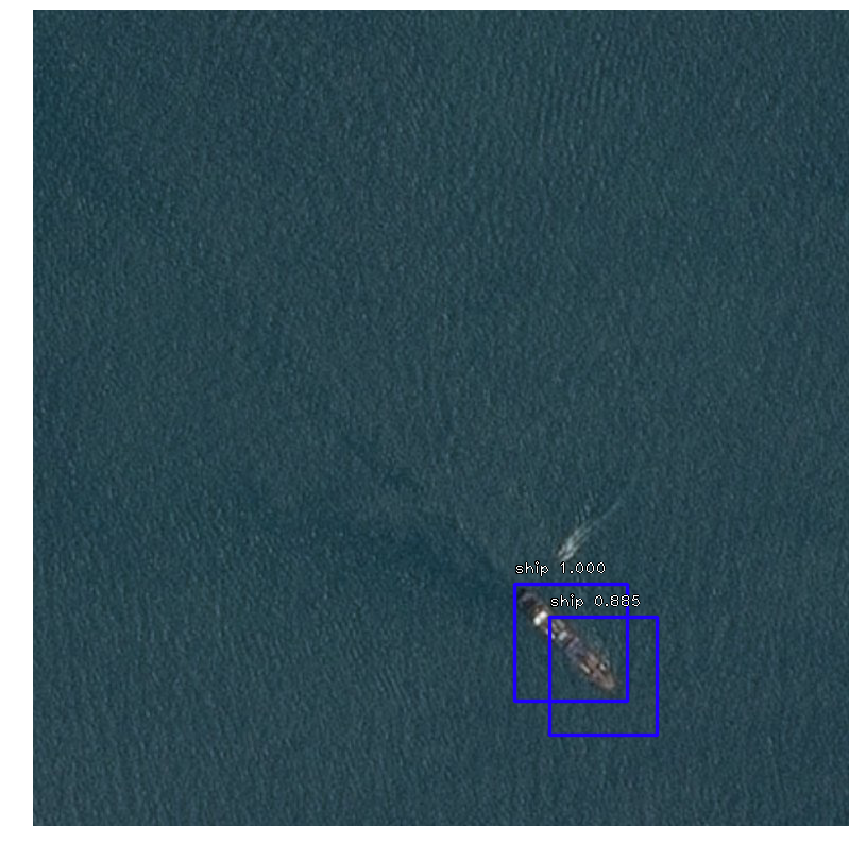

1e7dfe843.jpg
processing time:  1.026292085647583


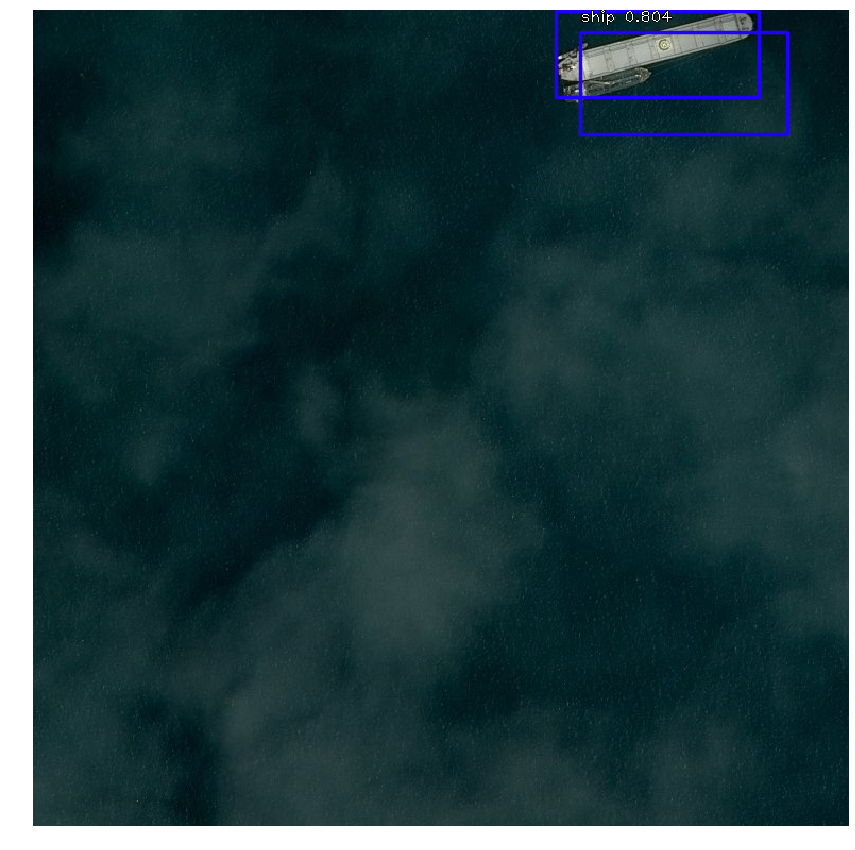

In [6]:
find_ships(['7038dc0da.jpg', '5c7138820.jpg', '1e7dfe843.jpg'])

Понякога, но рядко се разпознават като кораби и други обекти, които са близо до брега

399b9afeb.jpg
processing time:  1.0627961158752441


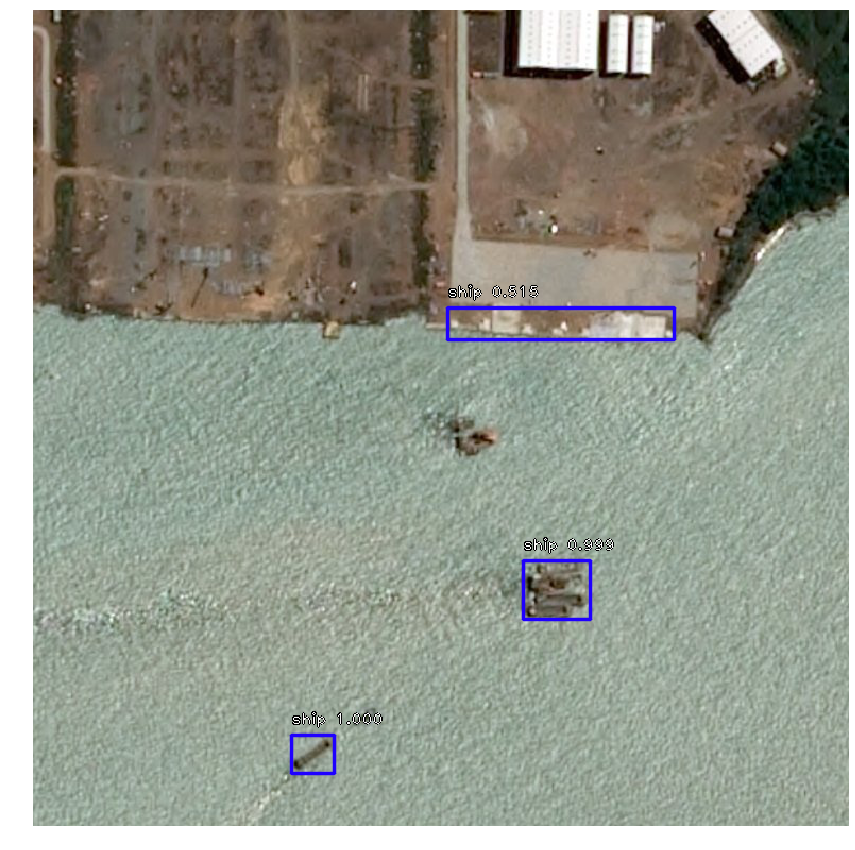

In [7]:
find_ships(['399b9afeb.jpg'])

Както очаквахме - кораби, които са много малки, изобщо не се разпознават

7e19bbc46.jpg
processing time:  1.0160024166107178


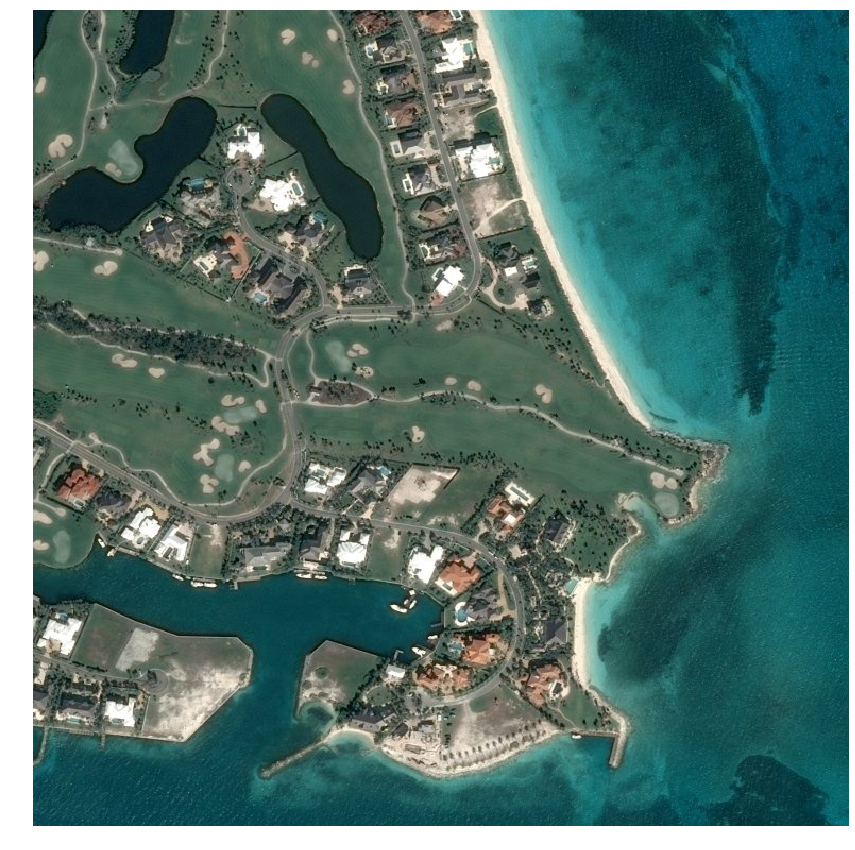

In [8]:
find_ships(['7e19bbc46.jpg'])

Но повечето примери са наистина добри. Разпознават се дори трудно забележими кораби:

08e292c4c.jpg
processing time:  1.0994799137115479


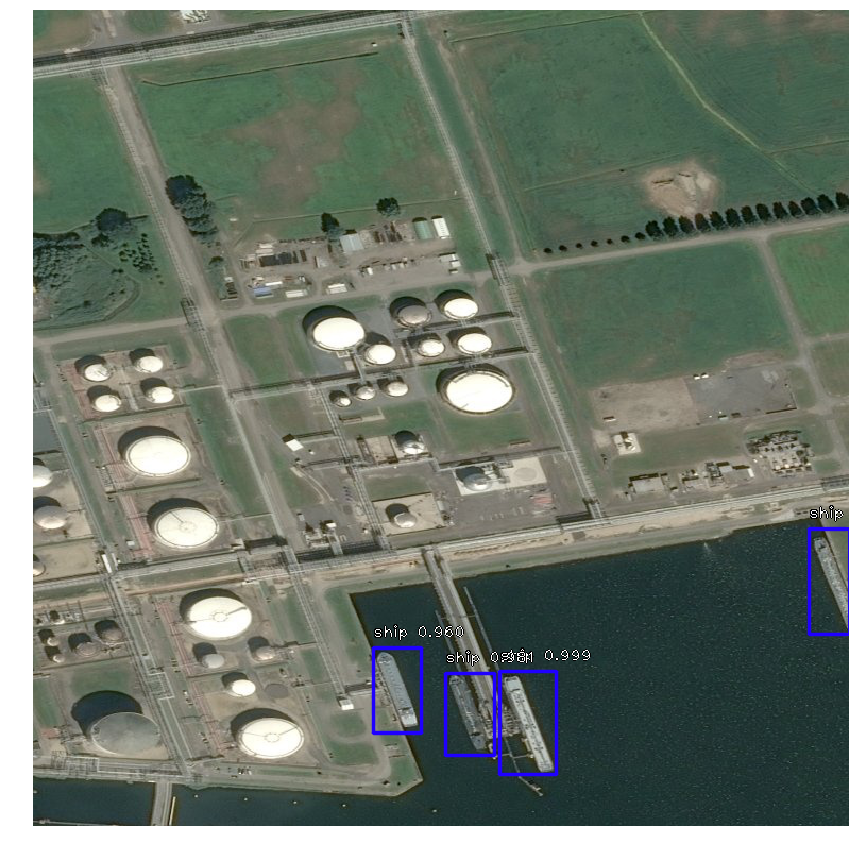

f7e6db7ca.jpg
processing time:  1.0325698852539062


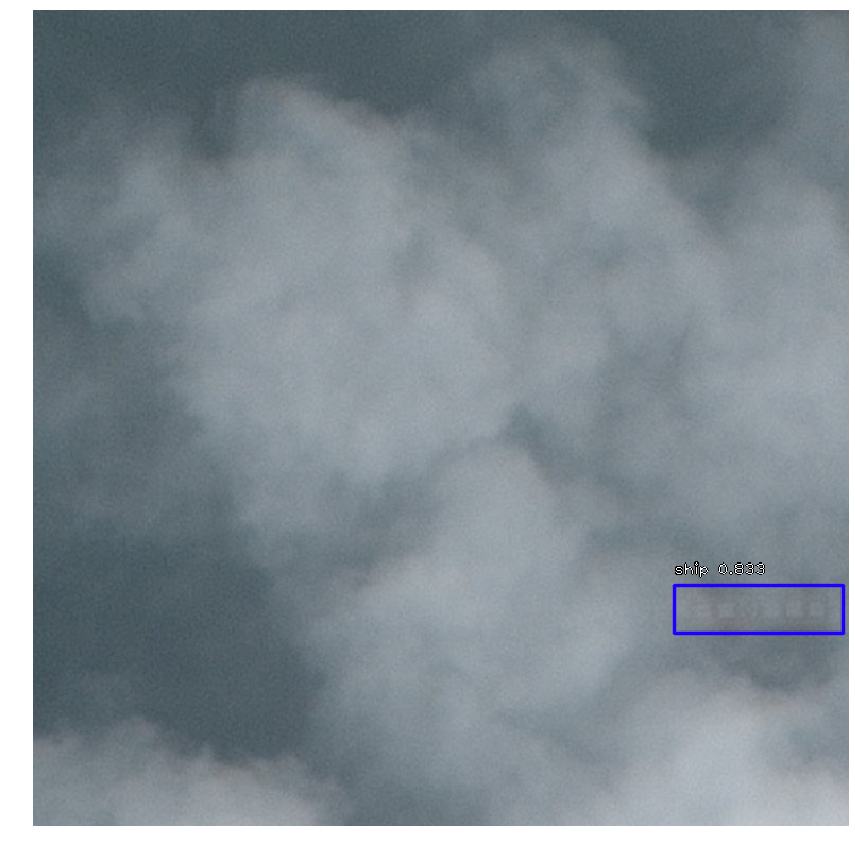

1ccc35901.jpg
processing time:  1.096151351928711


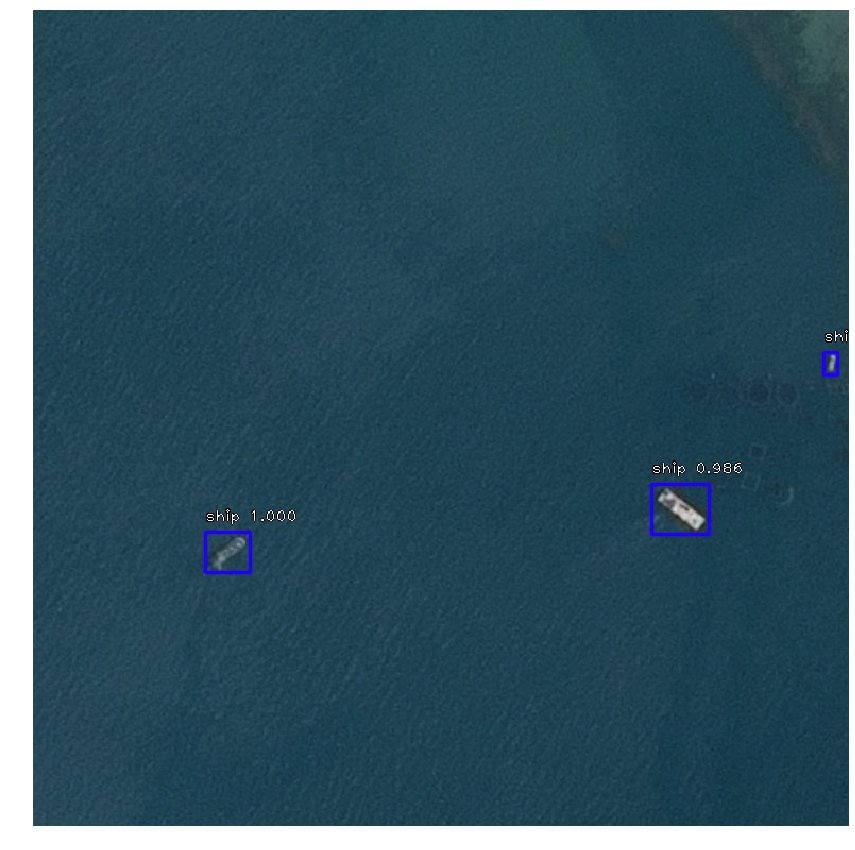

c774ac4fc.jpg
processing time:  1.0173606872558594


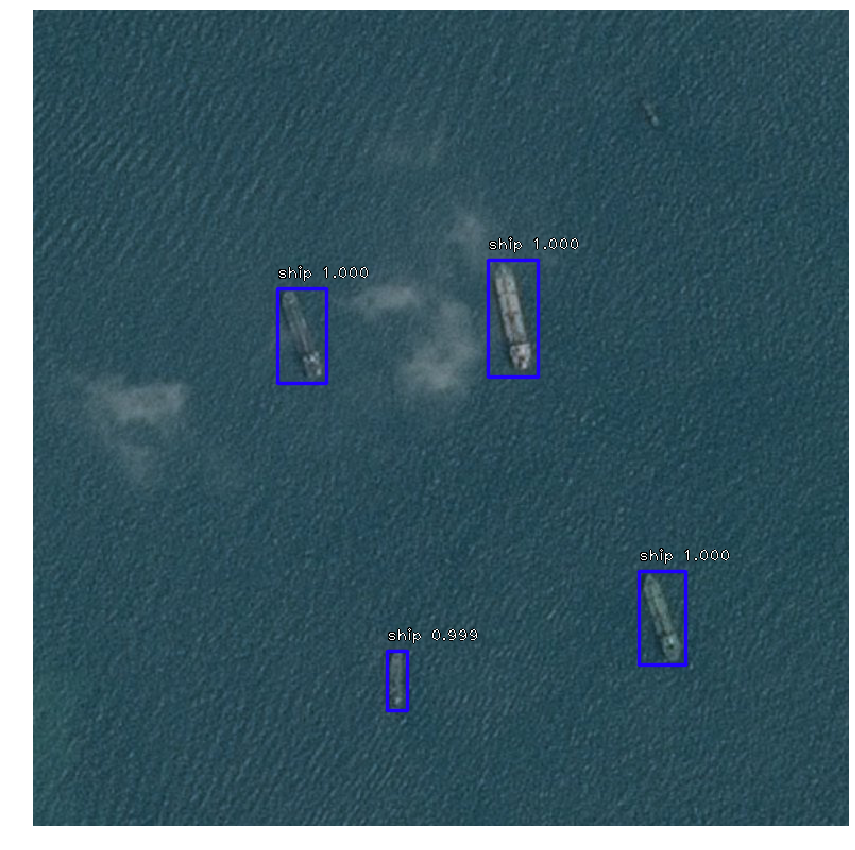

b8f400b68.jpg
processing time:  1.0338654518127441


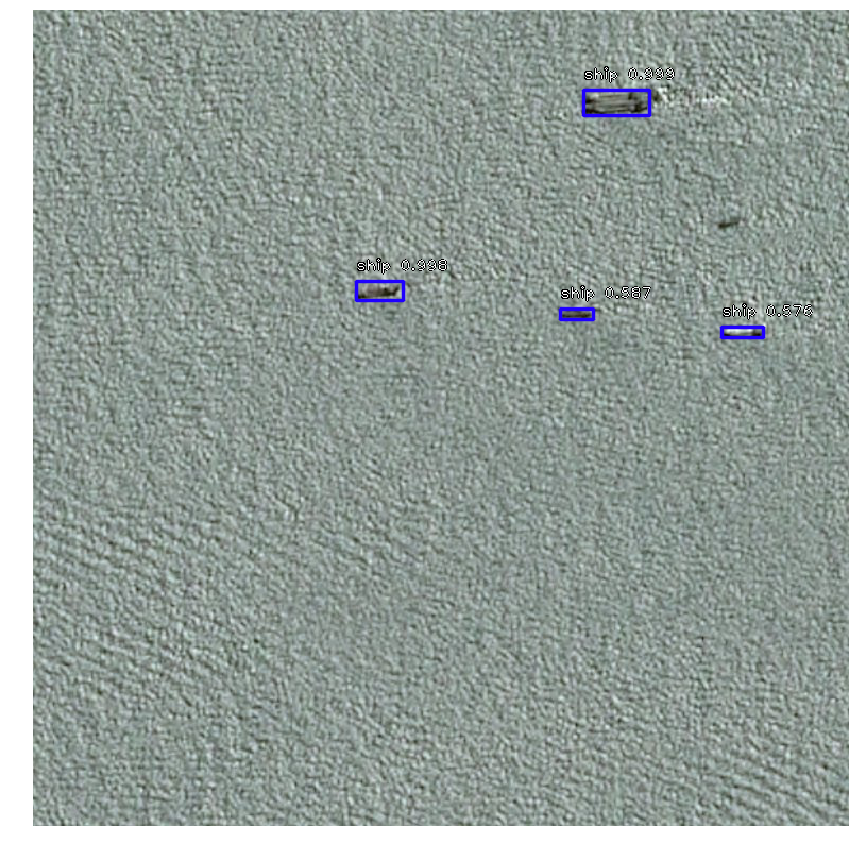

41ed69fc0.jpg
processing time:  1.0387709140777588


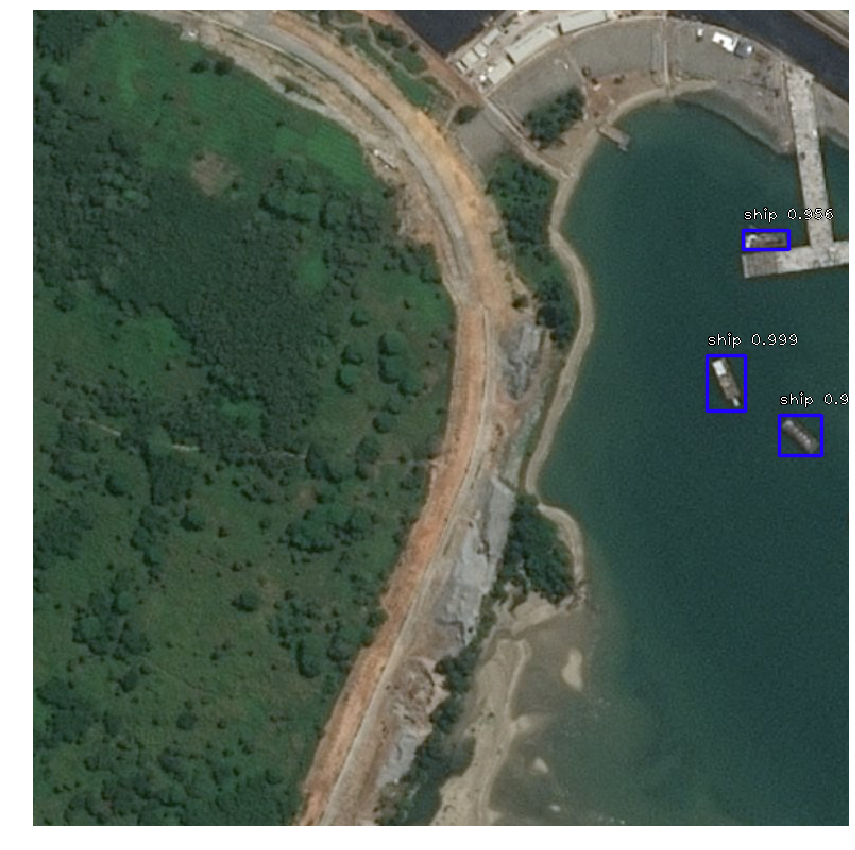

d712631ae.jpg
processing time:  1.0315849781036377


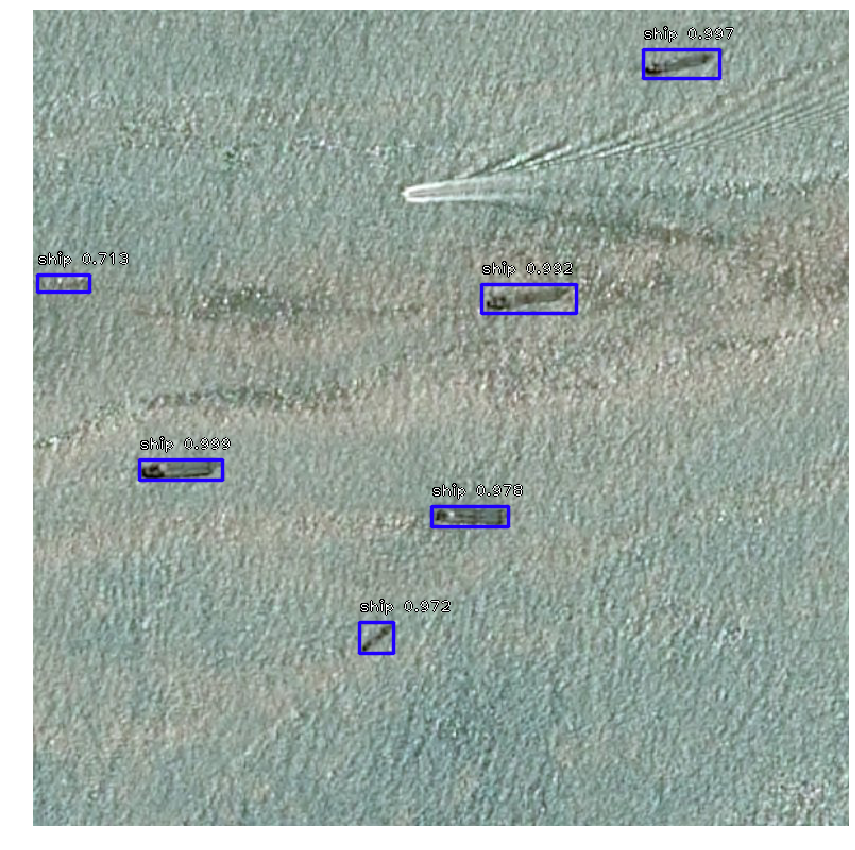

48e2b156c.jpg
processing time:  1.0152597427368164


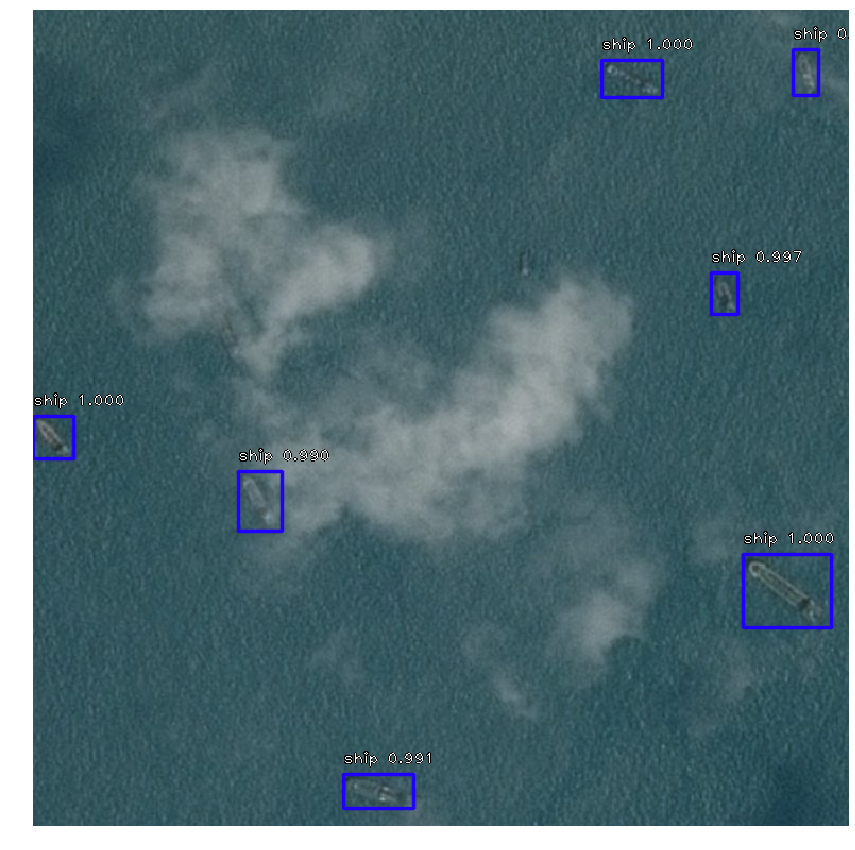

220df0d70.jpg
processing time:  1.014678716659546


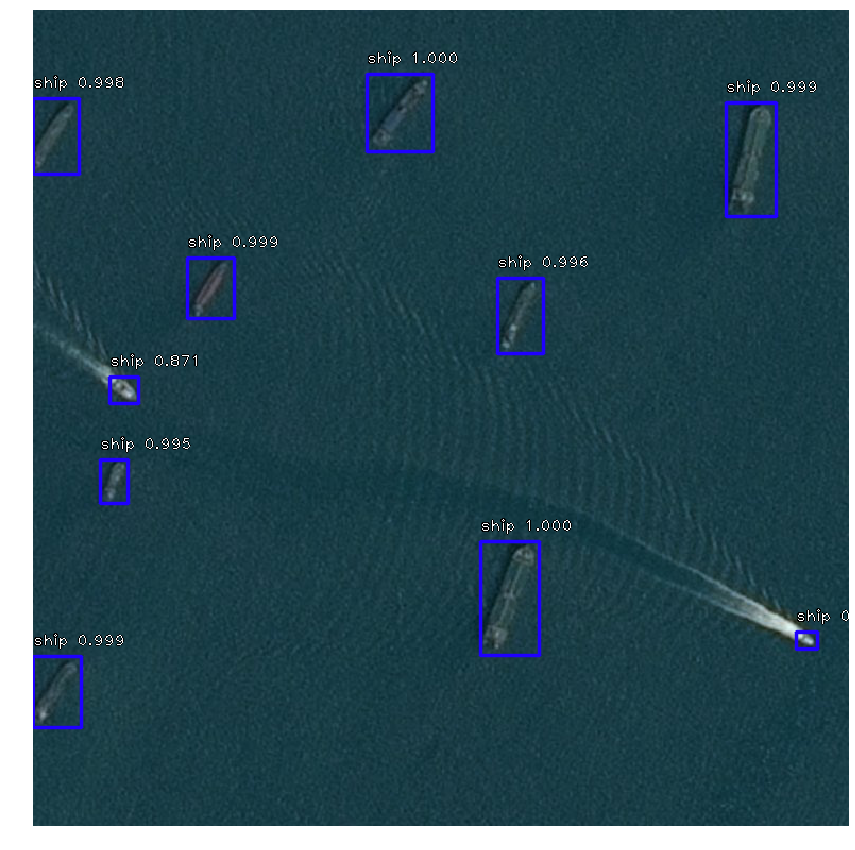

7e483ea08.jpg
processing time:  1.006978988647461


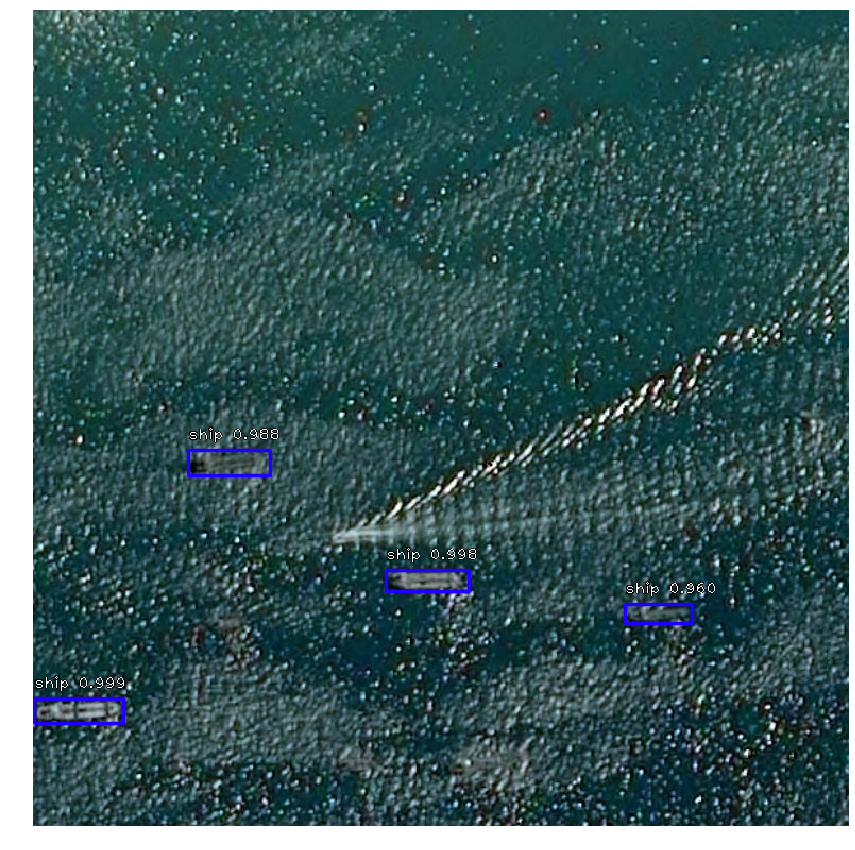

db65f3ecd.jpg
processing time:  1.0351271629333496


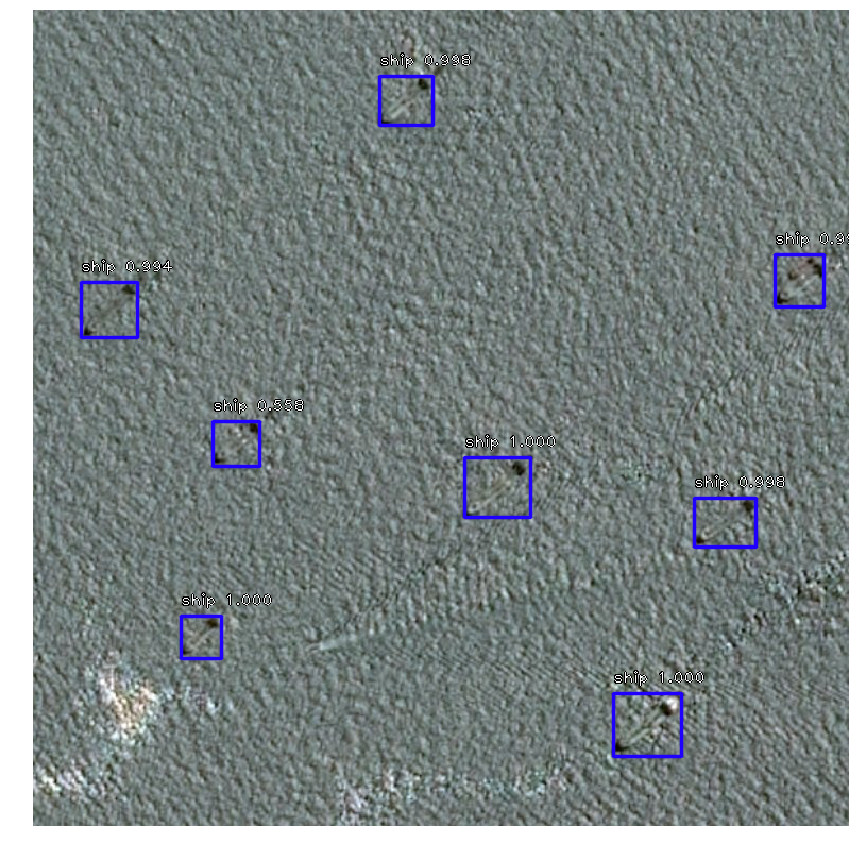

748fde772.jpg
processing time:  1.0280930995941162


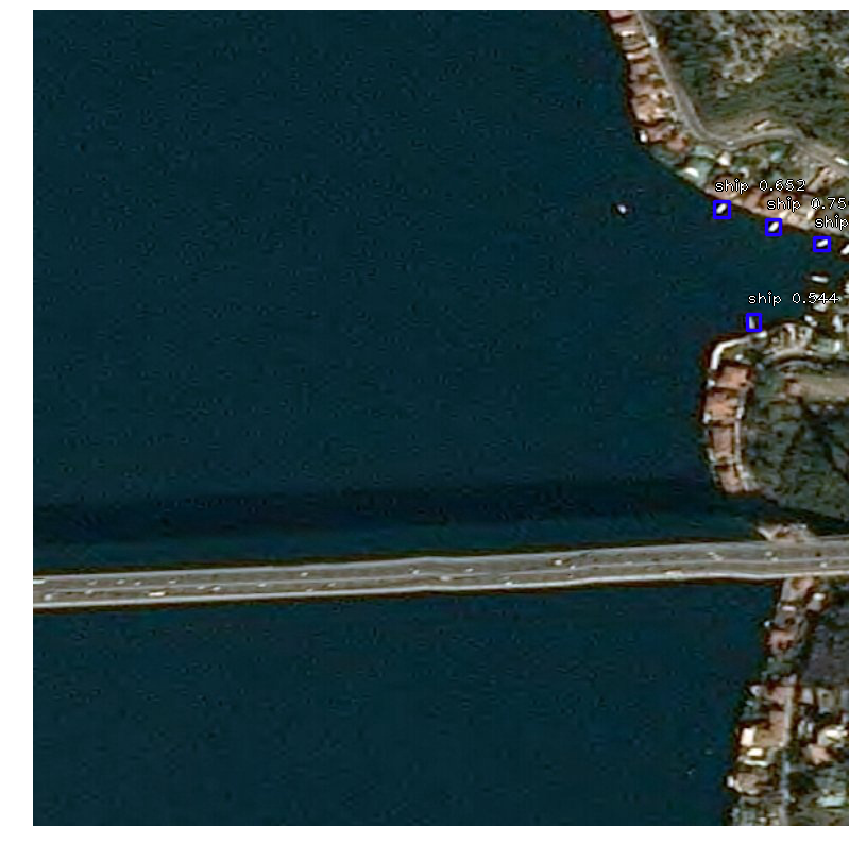

5dc90431e.jpg
processing time:  1.048210859298706


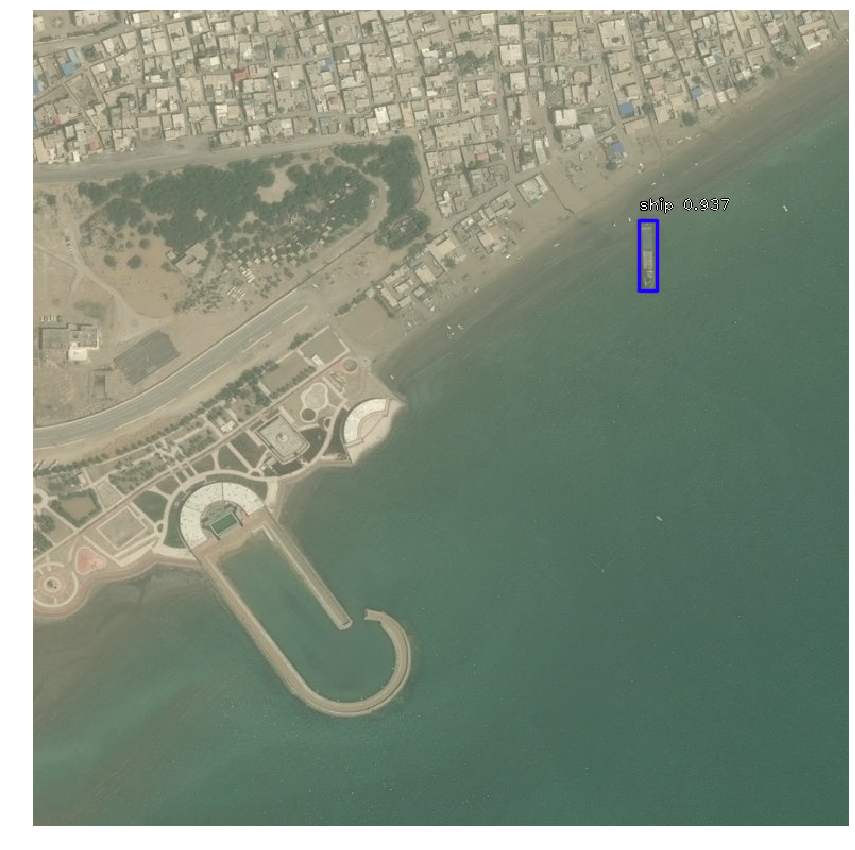

fb5782131.jpg
processing time:  1.0364902019500732


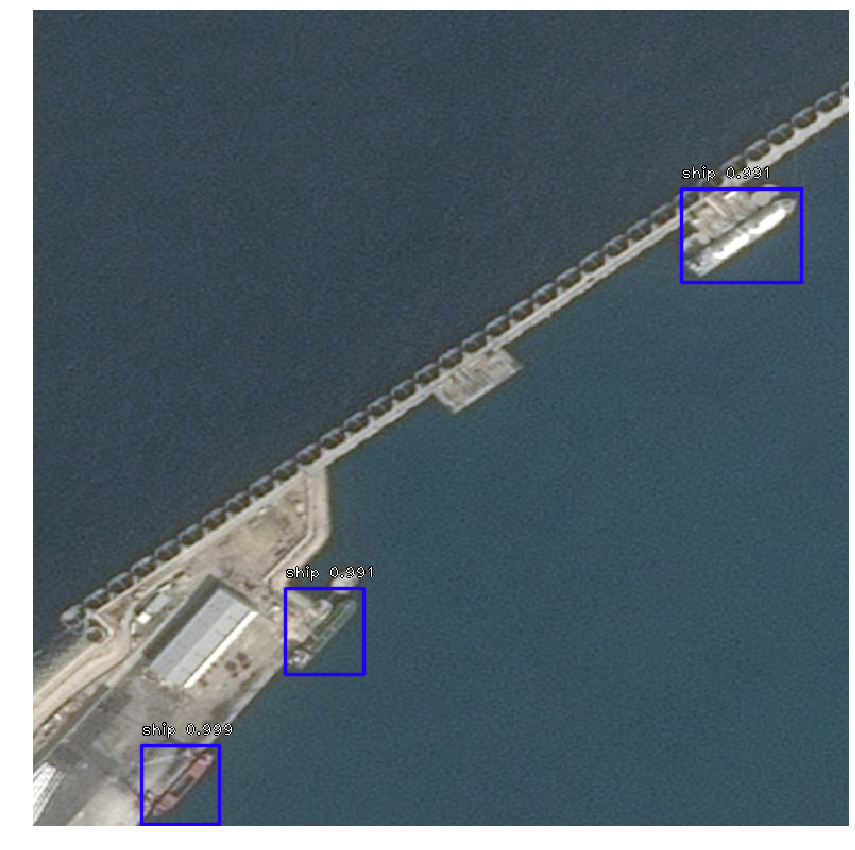

cf9ea31da.jpg
processing time:  1.0386199951171875


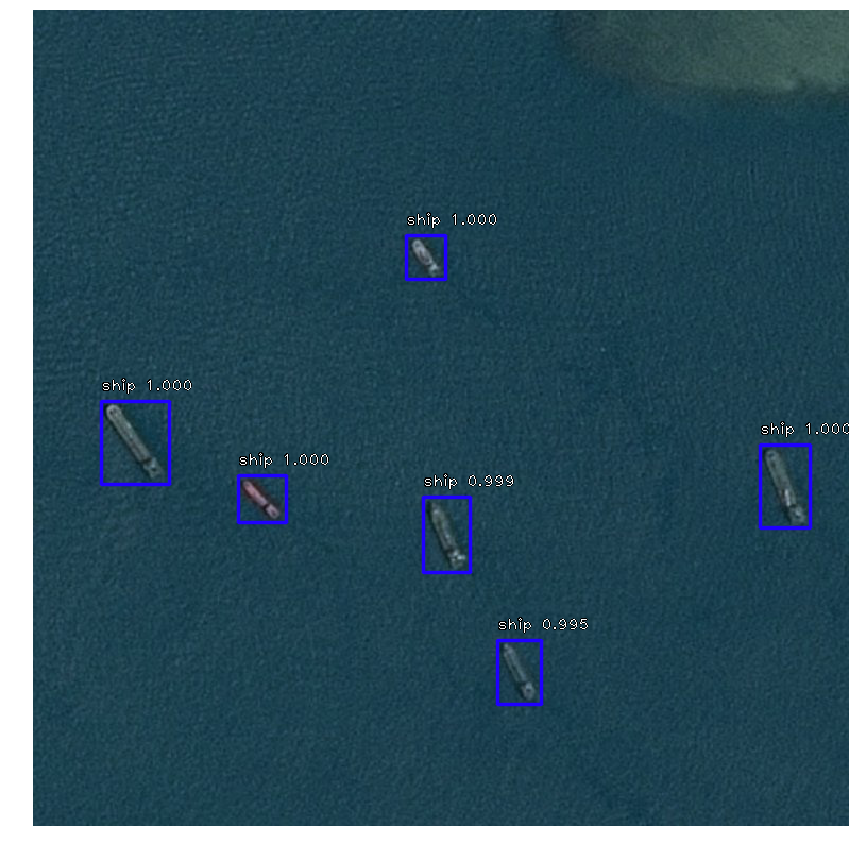

In [9]:
find_ships(['08e292c4c.jpg',
 'f7e6db7ca.jpg',
 '1ccc35901.jpg',
 'c774ac4fc.jpg',
 'b8f400b68.jpg',
 '41ed69fc0.jpg',
 'd712631ae.jpg',
 '48e2b156c.jpg',
 '220df0d70.jpg',
 '7e483ea08.jpg',
 'db65f3ecd.jpg',
 '748fde772.jpg',
 '5dc90431e.jpg',
 'fb5782131.jpg',
 'cf9ea31da.jpg'])